## Восстановление структуры

C:\Users\Jrytoeku Qtuhtc\AppData\Local\Temp\ipykernel_11196\3093838251.py:7: RuntimeWarning: invalid value encountered in divide
  y = 2*np.sin(x) / x # + np.random.normal(0, 0.02, n_points)
C:\Users\Jrytoeku Qtuhtc\AppData\Local\Temp\ipykernel_11196\3093838251.py:13: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


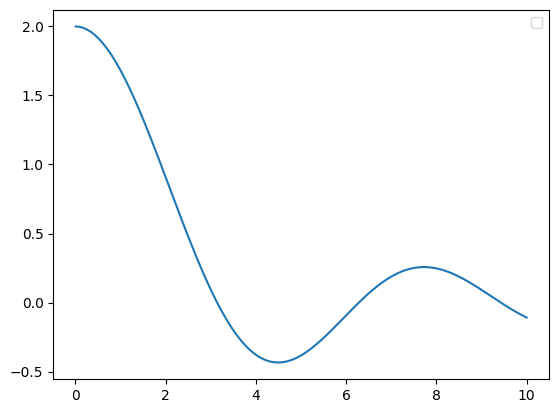

In [91]:
import numpy as np
import matplotlib.pyplot as plt


n_points = 1000
x = np.linspace(0, 10, n_points)
y = 2*np.sin(x) / x # + np.random.normal(0, 0.02, n_points)

x = x[~np.isnan(y)]
y = y[~np.isnan(y)]

plt.plot(x, y)
plt.legend()
plt.show()

In [109]:
from sklearn.neural_network import BernoulliRBM
from sklearn.preprocessing import MinMaxScaler


window_size = 40
scaler = MinMaxScaler()
y_normalized = scaler.fit_transform(y.reshape(-1, 1)).flatten()
X = np.array([y_normalized[i:i+window_size] for i in range(n_points - window_size)])

rbm = BernoulliRBM(n_components=72, learning_rate=0.007, n_iter=300, random_state=42)
rbm.fit(X)

BernoulliRBM(learning_rate=0.007, n_components=72, n_iter=300, random_state=42)

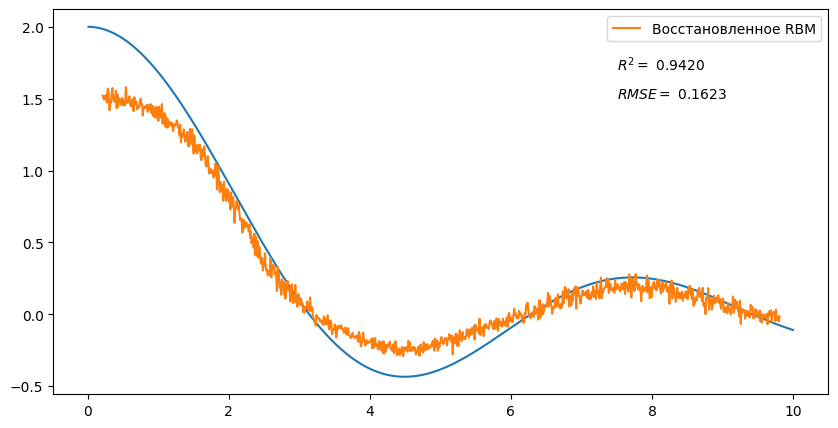

In [ ]:
from sklearn.metrics import r2_score, root_mean_squared_error


reconstructed = scaler.inverse_transform(np.mean([rbm.gibbs(X).astype(float) for _ in range(30)], axis=0)
                                         .mean(axis=1).reshape(1, -1))  # scaler.inverse_transform(rbm.gibbs(X))

plt.figure(figsize=(10, 5))
plt.plot(x, y)
plt.plot(x[window_size//2:-window_size//2 + 1], reconstructed.flatten(), label='Восстановленное RBM')
plt.text(7.5, 1.7, f'$R^2=$ {r2_score(y[window_size//2:-window_size//2 + 1], reconstructed.flatten()):.4f}')
plt.text(7.5, 1.5, f'$RMSE=$ {root_mean_squared_error(y[window_size//2:-window_size//2 + 1], reconstructed.flatten()):.4f}')
plt.legend()
plt.show()

## Рекомендательная система

In [1]:
import pandas as pd

ratings = pd.read_csv("ratings_small.csv")
ratings['movieId'] = ratings['movieId'].astype(str)
movies = pd.read_csv("movies_metadata.csv")[["id", "title"]]

ratings = ratings[["userId", "movieId", "rating"]]
ratings.head()

C:\Users\Jrytoeku Qtuhtc\AppData\Local\Temp\ipykernel_4212\1838299963.py:5: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  movies = pd.read_csv("movies_metadata.csv")[["id", "title"]]


,userId,movieId,rating
0,1,31,2.5
1,1,1029,3.0
2,1,1061,3.0
3,1,1129,2.0
4,1,1172,4.0


In [2]:
ratings_matrix = ratings.pivot(index="userId", columns="movieId", values="rating").fillna(0)
ratings_matrix

movieId,1,10,100,100017,100032,100034,100083,100106,100159,100163,...,99795,998,99811,99813,99839,99846,999,99912,99917,99992
userId,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
668,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
669,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [3]:
from sklearn.preprocessing import MinMaxScaler


scaler = MinMaxScaler()
ratings_scaled = scaler.fit_transform(ratings_matrix)
ratings_scaled = pd.DataFrame(ratings_scaled, columns=ratings_matrix.columns, index=ratings_matrix.index)
ratings_scaled

movieId,1,10,100,100017,100032,100034,100083,100106,100159,100163,...,99795,998,99811,99813,99839,99846,999,99912,99917,99992
userId,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
668,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
669,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [42]:
from sklearn.neural_network import BernoulliRBM

rbm = BernoulliRBM(
    n_components=72,
    learning_rate=0.007,
    n_iter=60,
    random_state=42,
    # verbose=True
)
rbm.fit(ratings_scaled)

BernoulliRBM(learning_rate=0.007, n_components=72, n_iter=60, random_state=42)

In [43]:
predicted_ratings = scaler.inverse_transform(sum(rbm.gibbs(ratings_scaled.values)  for _ in range(30)) / 30)
predicted_ratings = pd.DataFrame(
    predicted_ratings,
    columns=ratings_matrix.columns,
    index=ratings_matrix.index
)
predicted_ratings.head()

movieId,1,10,100,100017,100032,100034,100083,100106,100159,100163,...,99795,998,99811,99813,99839,99846,999,99912,99917,99992
userId,,,,,,,,,,,,,,,,,,,,,
1,0.000000,0.000000,0.166667,0.0,0.0,0.0,0.0,0.0,0.133333,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
3,0.000000,0.333333,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.166667,0.0,0.0,0.0
4,1.833333,0.666667,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.166667,0.0,0.0,0.0
5,1.666667,0.666667,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.166667,0.0,0.0,0.0


In [45]:
def recommend_movies(user_id, n=5):
    global predicted_ratings, ratings_matrix, movies

    user_ratings = predicted_ratings.loc[user_id]
    watched_movies = ratings_matrix.loc[user_id][ratings_matrix.loc[user_id] > 0].index
    user_ratings = user_ratings.drop(watched_movies, errors="ignore")

    top_movies = user_ratings.sort_values(ascending=False).head(n)
    top_movies = pd.DataFrame(top_movies).reset_index()
    top_movies = top_movies.merge(movies, how='inner', left_on="movieId", right_on="id")[["title", "movieId", user_id]]
    
    return top_movies


In [55]:
recommend_movies(306, n=10)

,title,movieId,306
0,Silent Hill,588,3.166667
1,5 Card Stud,4993,3.166667
2,Jacob's Ladder,2291,3.000000


In [51]:
from sklearn.metrics import root_mean_squared_error, r2_score
from sklearn.model_selection import train_test_split


train, test = train_test_split(ratings_scaled, test_size=0.2)
rbm.fit(train)

predicted = sum(rbm.gibbs(test.values) for _ in range(30)) / 30
predicted = scaler.inverse_transform(predicted)

rmse = root_mean_squared_error(scaler.inverse_transform(test.values), predicted)
r2 = r2_score(scaler.inverse_transform(test.values), predicted)
print(f"R^2: {r2:.3f}")
print(f"RMSE: {rmse:.3f}")

R^2: -0.059
RMSE: 0.306
